# **vil_images_generation**

Goal: Generating the missing “vil” images based on a sequence of “vis”, “ir069”, and “ir107” images from a single storm.



Analysis: This task is to generate an image of vil based on the images of the other three channels. Since there is no temporal connection between the channels, so it is a pure image generation task.

**Best Model: 4 layer UNet with SE and CBAM self-attention mechanism.**

# Dependent libraries

In [46]:
import os
import io
import pandas as pd
import h5py
import IPython
import PIL
from IPython.display import Image, display
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model,load_model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Multiply
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Reshape,Lambda,BatchNormalization
from tensorflow.keras.layers import Add, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG19,VGG16
from tensorflow.keras.callbacks import ModelCheckpoint


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Loading Data

In [4]:
from huggingface_hub import hf_hub_download

hf_hub_download(repo_id="benmoseley/ese-dl-2024-25-group-project", filename="train.h5", repo_type="dataset", local_dir="data")
hf_hub_download(repo_id="benmoseley/ese-dl-2024-25-group-project", filename="events.csv", repo_type="dataset", local_dir="data")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


train.h5:   0%|          | 0.00/10.7G [00:00<?, ?B/s]

events.csv:   0%|          | 0.00/782k [00:00<?, ?B/s]

'data/events.csv'

## Data Viewing

Load and display the event.csv file to see what is useful for task 2.

In [6]:
# Load the events.csv

df = pd.read_csv("data/events.csv", parse_dates=["start_utc"])
df

,id,img_type,start_utc,llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon,proj,height_m,width_m
0,S778114,ir069,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
1,S778114,ir107,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
2,S778114,lght,NaT,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3,S778114,vil,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
4,S778114,vis,2018-08-20 19:50:00+00:00,32.781533,-92.631841,35.944590,-88.134075,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
...,...,...,...,...,...,...,...,...,...,...
3995,S832818,ir069,2019-07-28 17:44:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3996,S832818,ir107,2019-07-28 17:44:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3997,S832818,lght,NaT,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0
3998,S832818,vil,2019-07-28 17:45:00+00:00,46.493514,-100.371384,49.953392,-95.191216,+proj=laea +lat_0=38 +lon_0=-98 +units=m +a=63...,384000.0,384000.0


See how many events are in the dataset. There are 800 events in the dataset, which in turn determines the division of the training set and validation set based on the number of data.

In [7]:
print(f"Total number of events: {len(df.id.unique())}")

Total number of events: 800


View the data types of values for 4 channels.

In [9]:
# Load event
def load_event(id):
    with h5py.File('data/train.h5','r') as f:
        event = {img_type: f[id][img_type][:] for img_type in ['vis', 'ir069', 'ir107', 'vil', 'lght']}
    return event

# Load an event for a given id
event = load_event("S778114")
for img_type in event:
    print(f"{img_type}: {event[img_type].shape} ({event[img_type].dtype})")

vis: (384, 384, 36) (int16)
ir069: (192, 192, 36) (int16)
ir107: (192, 192, 36) (int16)
vil: (384, 384, 36) (uint8)
lght: (38777, 5) (float32)


View the range of values for different channels.

In [10]:
# Display the range of values for each channel

print(f"range of vis: min={event['vis'].min()}, max={event['vis'].max()}")
print(f"range of ir069: min={event['ir069'].min()}, max={event['ir069'].max()}")
print(f"range of ir107: min={event['ir107'].min()}, max={event['ir107'].max()}")
print(f"range of vil: min={event['vil'].min()}, max={event['vil'].max()}\n")

range of vis: min=76, max=11409
range of ir069: min=-8013, max=-1199
range of ir107: min=-7726, max=2594
range of vil: min=0, max=254



View GIFs of 4 channels (36 frames).

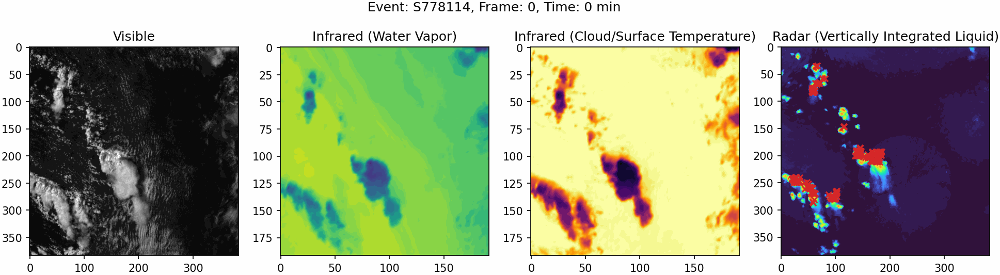

In [11]:


def make_gif(outfile, files, fps=10, loop=0):
    """
    Create and save a GIF from a sequence of image files.

    :param outfile: Name of the output GIF file.
    :param files: List of image file paths to include in the GIF.
    :param fps: Frames per second for the GIF animation.
    :param loop: Number of times the GIF should loop (0 = infinite loop).
    :return: An IPython display image of the generated GIF.
    """

    imgs = [PIL.Image.open(file) for file in files]  # Load all images from file paths
    imgs[0].save(fp=outfile, format='gif', append_images=imgs[1:],
                 save_all=True, duration=int(1000/fps), loop=loop)  # Create the GIF
    im = IPython.display.Image(filename=outfile)  # Load the GIF for display in Jupyter Notebook
    im.reload()  # Reload to ensure it's updated

    return im  # Return the generated GIF


def plot_event(id, output_gif=False, save_gif=False):
    """
    Plot a storm event across different satellite and radar channels.

    :param id: The unique identifier of the storm event.
    :param output_gif: If True, generate and save an animated GIF of the event.
    :param save_gif: If True, keep the saved GIF file. If False, delete it after displaying.
    """

    event = load_event(id) # Load event data
    t = event["lght"][:,0] # time of lightning strike (in seconds relative to first frame)

    def plot_frame(ti):
        """
        Generate and plot a single frame of the event.

        :param ti: The time index (frame number) to plot.
        """
        # Filter lightning strikes within 2.5 minutes of the current frame
        f = (t >= ti*5*60 - 2.5*60) & (t < ti*5*60 + 2.5*60)

        # Create a 1x4 grid of subplots and set the title
        fig,axs = plt.subplots(1,4,figsize=(16,4))
        fig.suptitle(f"Event: {id}, Frame: {ti}, Time: {ti*5} min")

        # Plot each channel in a separate subplot
        axs[0].imshow(event["vis"][:,:,ti], vmin=0, vmax=10000, cmap="grey"), axs[0].set_title('Visible')
        axs[1].imshow(event["ir069"][:,:,ti], vmin=-8000, vmax=-1000, cmap="viridis"), axs[1].set_title('Infrared (Water Vapor)')
        axs[2].imshow(event["ir107"][:,:,ti], vmin=-7000, vmax=2000, cmap="inferno"), axs[2].set_title('Infrared (Cloud/Surface Temperature)')
        axs[3].imshow(event["vil"][:,:,ti], vmin=0, vmax=255, cmap="turbo"), axs[3].set_title('Radar (Vertically Integrated Liquid)')
        axs[3].scatter(event["lght"][f,3], event["lght"][f,4], marker="x", s=30, c="tab:red")
        axs[3].set_xlim(0,384), axs[3].set_ylim(384,0)

        if output_gif:
            file = f"_temp_{id}_{ti}.png"
            fig.savefig(file, bbox_inches="tight", dpi=150, pad_inches=0.02, facecolor="white")
            plt.close()
        else:
            plt.show()

    if output_gif:
        for ti in range(36): plot_frame(ti)
        im = make_gif(f"{id}.gif", [f"_temp_{id}_{ti}.png" for ti in range(36)])
        for ti in range(36): os.remove(f"_temp_{id}_{ti}.png")
        IPython.display.display(im)
        if not save_gif: os.remove(f"{id}.gif")
    else:
        plot_frame(0)
        plot_frame(17)
        plot_frame(34)

# Plot an event
plot_event("S778114", output_gif=True, save_gif=True)


View the temporal and geographic distribution of the data

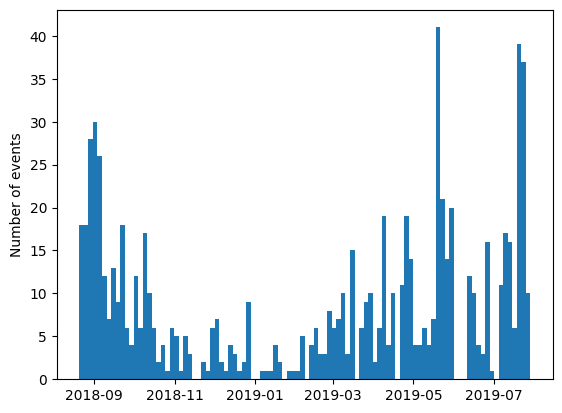

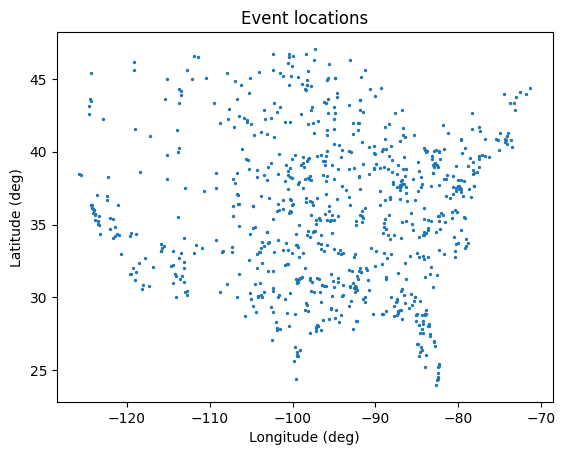

In [12]:
# Let's plot some meta data histograms!

# Plot times
plt.hist(df[df.img_type=="vil"].start_utc.dt.tz_localize(None), bins=100)
plt.ylabel("Number of events")
plt.show()

# Plot positions
plt.title("Event locations")
plt.scatter(df[df.img_type=="vil"].llcrnrlon, df[df.img_type=="vil"].llcrnrlat, s=2)
plt.xlabel("Longitude (deg)"); plt.ylabel("Latitude (deg)")
plt.show()

# Data Processing



1. Print the shapes of the “vis,” “ir069,” and “ir107” channels, and observe that the shapes are inconsistent. We apply **[upsampling](https://blog.csdn.net/puspos/article/details/120056654)** to unify the shape to (384, 384, 36).

    <img src="images/data_shape.png" alt="description" width="250" height="100">

    The corresponding code is as follows:

    ```python
    ir069_resized = resize(ir069[:, :, i], target_shape, mode='reflect')
    ir107_resized = resize(ir107[:, :, i], target_shape, mode='reflect')
    ```

2. Since the data ranges of the different channels vary significantly, we apply **min-max normalization** to scale all values to the range [0, 1]. To prevent division by zero during normalization, we add a very small positive number (1e-8) to the denominator.
    >Sample 1:
    >
    >Range of vis: min=76, max=11409  
    >Range of ir069: min=-8013, max=-1199  
    >Range of ir107: min=-7726, max=2594  
    >Range of vil: min=0, max=254  

    The corresponding code is as follows:

    ```python
    X_vis = (vis_1 - vis_1.min()) / (vis_1.max() - vis_1.min() + 1e-8)  # Normalize to [0,1]
    X_ir069 = (ir069_resized - ir069_resized.min()) / (ir069_resized.max() - ir069_resized.min() + 1e-8)
    X_ir107 = (ir107_resized - ir107_resized.min()) / (ir107_resized.max() - ir107_resized.min() + 1e-8)
    X_vil = (vil_1 - vil_1.min()) / (vil_1.max() - vil_1.min() + 1e-8)
    ```

3. Since we need to input data from three channels into the model, we use **stacking** to batch the data, ensuring correct input format for the model.

    The corresponding code is as follows:
    ```python
    X_frame = np.stack([X_vis, X_ir069, X_ir107], axis=-1)
    ```

4. The processed data is randomly split into training and validation, with a ratio of **0.9:0.1**.

<!-- 
# Data processing
1. 打印“vis”, “ir069”, and “ir107” 通道的形状，发现形状不一致。**我们采用[上采样](https://blog.csdn.net/puspos/article/details/120056654)**，将shape统一为(384, 384, 3622)

    <img src="images/data_shape.png" alt="描述文字" width="250" height="100">

    对应的代码如下：

    
python
    ir069_resized = resize(ir069[:, :, i], target_shape, mode='reflect')
    ir107_resized = resize(ir107[:, :, i], target_shape, mode='reflect')


2. 因为之前看到不同通道的数据范围不同，且相差较大。我们采用**最大最小归一化**，将数值全部归一化到[0,1]。其中，为了防止归一化的时候出现分母为0的情况，我们在分母处引入一个很小的正数（这里是 1e-8）。
    >sample 1：
    >
    >range of vis: min=76, max=11409
    >
    >range of ir069: min=-8013, max=-1199
    >
    >range of ir107: min=-7726, max=2594
    >
    >range of vil: min=0, max=254

    对应代码如下：

    
python
    X_vis = (vis_1 - vis_1.min()) / (vis_1.max() - vis_1.min()+1e-8)  # normalize to [0,1]
    X_ir069 = (ir069_resized - ir069_resized.min()) / (ir069_resized.max() - ir069_resized.min()+1e-8)
    X_ir107 = (ir107_resized - ir107_resized.min()) / (ir107_resized.max() - ir107_resized.min()+1e-8)
    X_vil=(vil_1 - vil_1.min()) / (vil_1.max() - vil_1.min()+1e-8)

3. 因为我们需要将三个通道的数据输入模型，我们采取**stack**将数据成批堆叠，确保能够正确输入模型。

    对应代码如下：
    
python
    X_frame = np.stack([X_vis, X_ir069, X_ir107], axis=-1)


4. 我们将处理好的数据，按照**0.8:0.1:0.1**的比例，随机生成训练集，验证集和测试集。翻译成英文 -->

In [13]:
import h5py
import numpy as np
import random
import tensorflow as tf
from skimage.transform import resize


# HDF5 file path
file_path = "data/train.h5"

# Define generators to load data frame-by-frame from HDF5 files on demand
def frame_generator(file_path, event_ids, batch_size, target_shape=(384, 384)):
    """
    A generator function to yield batches of input and target frames for training or testing deep learning models.

    This function reads multi-channel weather data (VIS, IR069, IR107, and VIL) from an HDF5 file, processes each frame
    (including resizing and normalization), and yields batches of stacked input frames and their corresponding target frames.

    Parameters:
    ----------
    file_path : str
        Path to the HDF5 file containing weather event data. Each event is stored as a group with multiple datasets (e.g., "vis", "ir069", "ir107", "vil").

    event_ids : list of str
        A list of event IDs (keys of the groups in the HDF5 file) to be processed.

    batch_size : int
        The number of frames per batch. The function will yield batches of size `batch_size`, except possibly for the last batch.

    target_shape : tuple of int, optional, default=(384, 384)
        The target resolution (height, width) to which lower-resolution channels (e.g., "ir069" and "ir107") will be resized.

    Returns:
    -------
    generator
        A generator that yields tuples `(X_batch, y_batch)`:

        - `X_batch`: numpy array of shape `(batch_size, height, width, 3)`
          Contains the normalized and stacked input frames for the batch.
          The 3 channels correspond to VIS, IR069, and IR107 data.

        - `y_batch`: numpy array of shape `(batch_size, height, width)`
          Contains the normalized VIL target frames for the batch.
    """


    with h5py.File(file_path, 'r') as f:
        X_batch, y_batch = [], []

        # Infinite loop to keep the generator open
        while True:
          for event_id in event_ids:

              # Save the channels to variables
              vis = f[event_id]["vis"][:]
              ir069 = f[event_id]["ir069"][:]
              ir107 = f[event_id]["ir107"][:]
              vil = f[event_id]["vil"][:]

            # Read and process one frame at a time
              for i in range(vis.shape[2]):  # Iterate through each frame

                # Unified resolution, upsampling low resolution ir069 and ir107 to target resolution (384x384)
                  ir069_resized = resize(ir069[:, :, i], target_shape, mode='reflect')
                  ir107_resized = resize(ir107[:, :, i], target_shape, mode='reflect')

                # Save the values to variables
                  vis_1=vis[:, :, i]
                  vil_1=vil[:, :, i]

                # Min-max normalization
                  X_vis = (vis_1 - vis_1.min()) / (vis_1.max() - vis_1.min()+1e-8)  # normalize to [0,1]
                  X_ir069 = (ir069_resized - ir069_resized.min()) / (ir069_resized.max() - ir069_resized.min()+1e-8)
                  X_ir107 = (ir107_resized - ir107_resized.min()) / (ir107_resized.max() - ir107_resized.min()+1e-8)
                  X_vil=(vil_1 - vil_1.min()) / (vil_1.max() - vil_1.min()+1e-8)

                # Stacking 3 channels as inputs
                  X_frame = np.stack([X_vis, X_ir069, X_ir107], axis=-1)

                # VIL as a target
                  y_frame = X_vil

                  X_batch.append(X_frame)
                  y_batch.append(y_frame)

                # Returns when batch is full
                  if len(X_batch) == batch_size:
                      yield np.array(X_batch), np.array(y_batch)
                      X_batch, y_batch = [], []

          # If the last remaining frames do not reach a full batch, also return the
          if len(X_batch) > 0:
              yield np.array(X_batch), np.array(y_batch)

# Get the IDs of all events
with h5py.File(file_path, 'r') as f:
    event_ids = list(f.keys())


Perform training and validation set segmentation, implement a data generator and batch size is 36 to represent 36 frames.

In [15]:
# Test Generator
batch_size = 36

# Divide the training set (90%) and the validation set (10%).
train_ids, val_ids = train_test_split(event_ids, test_size=0.1, random_state=42)

print(f"Number of training events: {len(train_ids)}, Number of validation events: {len(val_ids)}")

# Creating the train and validation generator
train_gen = frame_generator(file_path, train_ids, batch_size)
val_gen = frame_generator(file_path, val_ids, batch_size)

Number of training events: 720, Number of validation events: 80


# Model Construction----UNet_SE&CBAM



## Model Design

- **Model Summary**

    <mark>A **4-layer U-Net model** integrated with **channel attention** and **spatial attention** mechanisms.<mark/>

    | **Module**              | **Function**                                                                                     |
    |-------------------------|--------------------------------------------------------------------------------------------------|
    | Encoders                | Downsample input features to extract multi-scale features and provide high-resolution features via skip connections. |
    | Decoders                | Restore spatial resolution while combining features from corresponding encoder layers to enhance details, ultimately generating output images of the same size as the input. |
    | Attention               | Incorporates channel and spatial attention mechanisms to enhance feature representation, highlight important channels and key spatial areas, improving the accuracy of segmentation edges. |
    | Output Layer            | Generates single-channel output using a 1x1 convolution, typically for predicting segmentation probability maps ([H, W, 1]). |

- **Why Choose These Modules?**

    Based on [network research](https://zhuanlan.zhihu.com/p/58883095), the reasons for our final design are as follows:

    1. **The Strength of U-Net**:
       - U-Net is widely used in fields like medical image segmentation and remote sensing image processing because its skip connection design captures both high-resolution and contextual information.
       - The model is easy to extend by increasing the number of convolution kernels or using deeper networks to improve performance.

    2. **Importance of Two Attention Mechanisms**:
       - **Spatial Attention**: Highlights critical regions in the image, helping improve the accuracy of segmentation edges.
       - **Channel Attention**: Focuses on key channels in the image, enhancing the representation of features.

    3. **Advantages of Multi-Level Skip Connections**:
       - Skip connections in the decoder bring high-resolution features from the encoder, reducing information loss and mitigating blurring issues during upsampling.

    4. **Batch Normalization**:
       - Adding batch normalization after convolution layers effectively accelerates model training, stabilizes gradients, and reduces the risk of overfitting.

    5. **Multi-Scale Feature Extraction**:
       - By extracting features through multi-level encoders and gradually downsampling, the model captures contextual information at different spatial scales.
       - Decoders gradually upsample while combining skip-connected features, generating high-quality segmentation maps.

- **Activation Function**

    We tested multiple activation functions, and while the sigmoid function produced all-black images, the relu function showed better results:

    - **Sigmoid Function**: Extracted images were completely black because the function maps zero values to 0.5, causing the darker regions to brighten and reducing the contrast between bright and dark areas. This makes it unsuitable for this dataset and task.  
        <img src="images/sigmoid.png" alt="Description" width="300" height="150">

    - **ReLU Function**: Extracted images performed better, ensuring dark areas remain at 0 while better preserving the structure of the image.  
        <img src="images/relu.jpg" alt="Description" width="150" height="150">

- **Optimizer**

    Although AdamW theoretically provides better generalization and performs better on large or complex datasets, as seen in the images, it loses detail processing. Hence, we chose **Adam** as our optimizer.

    - **AdamW**:  
        <img src="images/adamw-compare.png" alt="Description" width="500" height="200">

    - **Adam**:  
        <img src="images/adam.jpg" alt="Description" width="500" height="200">

- **Attention block**

    In the VGG specific layer section, we chose Block 4 to enhance the model. We compared the commonly used blocks:

    Below is a comparative analysis table, showing the characteristics of each VGG Block and why Block 4 was chosen:

    | **VGG Block** | **Characteristics**                              | **Advantages**                                | **Disadvantages**                                 | **Applicability**                                |
    |-------------------|--------------------------------------------------|----------------------------------------------|--------------------------------------------------|--------------------------------------------------|
    | **Block 1**   | Lower-level features, mainly edges, textures, and local features | High spatial resolution, capable of capturing local details | Lacks global context, susceptible to noise, unable to handle significant contrast between bright and dark regions | Suitable for simpler tasks like texture analysis, but not for complex tasks like bright region prediction |
    | **Block 2**   | Similar to Block 1 but with slightly stronger semantics | Better semantic information, still mainly local details | Same as Block 1, lacks global context, prone to noise | Similar to Block 1, suitable for local feature tasks, not for complex bright region prediction tasks |
    | **Block 3**   | Middle-level features, contains both high-level semantic information and local details | Good semantic information, suitable for handling more complex tasks | Weaker understanding of global context, struggles with the difference between bright and dark regions | Suitable for moderately complex tasks, still insufficient for effective bright region prediction |
    | **Block 4**   | High-level semantic features, capable of capturing global context and complex semantics | Good semantic expression ability and spatial resolution, suitable for bright region prediction | May still have limitations in tasks requiring high precision positioning | Suitable for bright region prediction tasks, balances local and global information, ideal for combining with attention mechanisms |
    | **Block 5**   | Highest-level semantic features, strongest abstraction capability | Powerful abstraction, capable of extracting deep-level features | Loss of spatial information, low resolution, not beneficial for spatial localization | Suitable for high-level abstract tasks, but not for tasks requiring spatial information, such as bright region prediction |

    - **Reasons for choosing Block 4:**

        1. **Rich semantics**: Block 4's features contain both high-level semantic information and enough spatial resolution, making it suitable for precise localization and semantic understanding of bright regions.

        2. **Balanced characteristics**: Block 4 strikes a good balance between local and global features, making it more suitable than Block 1/2's local details and Block 5's global abstraction.

        3. **Adaptability to attention mechanisms**: When combined with channel and spatial attention, Block 4's features can better leverage the attention mechanism's ability to focus on important regions.

<!-- 
- **Attention block**

    在VGG特定层部分，我们选择了block4来对模型进行提升。我们对比了现在常用的block层：

    以下是对比分析的表格，展示了 VGG 各个 Block 的特点以及为什么选择 Block 4：

    | **VGG Block** | **特性**                                     | **优点**                                     | **劣势**                                       | **适用性**                                     |
    |---------------|----------------------------------------------|---------------------------------------------|------------------------------------------------|-----------------------------------------------|
    | **Block 1**   | 较低级特征，主要是边缘、纹理和局部特征        | 较高的空间分辨率，能够捕捉局部细节           | 缺乏全局上下文，噪声影响较大，难以处理亮部与背景的显著差异 | 适合较简单的任务，如纹理分析，但不适合亮部预测等复杂任务 |
    | **Block 2**   | 较低级特征，类似于 Block 1，但语义略强        | 更好的语义信息，依然是局部细节为主           | 同 Block 1，缺乏全局信息，易受噪声干扰           | 类似 Block 1，适合局部特征的任务，不适合复杂的亮部预测任务 |
    | **Block 3**   | 中层特征，包含一些高级语义信息和局部细节      | 较好的语义信息，适合处理一些复杂任务        | 对全局上下文理解较弱，亮部与背景差异处理能力较差   | 适合中等复杂度的任务，仍不足以有效处理亮部预测等任务  |
    | **Block 4**   | 高级语义特征，能够捕捉全局上下文和复杂语义    | 具有较好的语义表达能力和空间分辨率，适合亮部预测 | 对高精度定位要求较高的任务可能仍有不足           | 适合亮部预测任务，能够平衡局部与全局信息，适合与注意力机制结合 |
    | **Block 5**   | 最高级别的语义特征，抽象能力最强              | 强大的抽象能力，能够提取深层次的特征         | 丢失空间信息，分辨率较低，不利于空间定位         | 适合高层抽象任务，但不适合需要空间信息的任务，如亮部预测 |


    - 选择 **Block 4** 的主要原因是：
        1. **语义丰富**：Block 4 的特征既包含高层语义信息，又保留了足够的空间分辨率，适合亮部区域的精确定位和语义理解。
        2. **平衡特性**：Block 4 在局部和全局特征之间达到了较好的平衡，相比 Block 1/2 的局部细节和 Block 5 的全局抽象更为适用。
        3. **适配注意力机制**：结合通道和空间注意力时，Block 4 的特征能更好地发挥注意力机制对重要区域的聚焦能力。

 -->


<!-- # model----UNet_SE&CBAM

## model design
- the summary of model

    <mark>集成了**通道注意力**和**空间注意力**机制的**4层U-net模型**<mark/>

    | **模块**                | **功能**                                                                                     |
    |-------------------------|---------------------------------------------------------------------------------------------|
    | Encoders      | 下采样输入特征，提取多尺度特征，通过跳跃连接提供高分辨率特征。           |
    | Decoders      | 恢复空间分辨率，同时结合编码器对应层的特征增强细节，最终生成与输入尺寸相同的输出图像。         |
    | Attention  | 引入通道注意力和空间注意力，增强特征表达能力，突出重要通道和关键空间区域，有助于提高分割边缘的精确度。         |
    | Output Layer   | 通过 1x1 卷积生成单通道输出，通常用于预测分割概率图（[H, W, 1]）。                          |

- **为什么选择这些模块？**
    通过[查询网络资料](https://zhuanlan.zhihu.com/p/58883095)，我们做出最终选择的原因如下：

    1. **U-Net 的强大特性**:
   - U-Net 被广泛应用于医学图像分割、遥感影像处理等领域，因其跳跃连接设计能够同时捕获高分辨率和上下文信息。
   - 模型易于扩展，可通过增加卷积核数量、使用更深的网络提高性能。

    2. **2个注意力机制的重要性**:
   - Spatial Attention：突出了图像中的重要区域，有助于提高分割边缘的精确度。
   - Channel Attention：更加关注图像中的关键通道，提升特征的表达能力。

    3. **多层跳跃连接的优势**:
   - 在解码器部分，跳跃连接引入了编码器中的高分辨率特征，减少了信息丢失，避免上采样阶段模糊化问题。

    4. **批量归一化 (Batch Normalization)**:
   - 在卷积层后加入批量归一化，有效加速模型训练，稳定梯度，并减轻过拟合风险。

    5. **多尺度特征提取**:
   - 通过多层编码器提取特征并逐步下采样，模型能够捕获不同空间尺度的上下文信息。
   - 解码器逐步上采样并结合跳跃连接的细节特征，生成高质量的分割图。

- **activate function**

    我们尝试了多种激活函数，其中sigmoid函数得到的图像是全黑的，而relu函数的

    - sigmoid函数：提取出来的图像全黑，因为该函数会将0值映射到0.5，导致图像暗部被提亮，图像亮部和暗部的区分不明显，因此不适合该数据集和该任务。
        <img src="images/sigmoid.png" alt="描述文字" width="300" height="150">

    - relu函数：提取出来的图像效果较好。可以保证暗部为0，且对图像的结构解析更好。

        <img src="images/relu.jpg" alt="描述文字" width="150" height="150">


-  **optimazior**

    adamW虽然在理论上有更好的泛化效果，对处理大或者复杂的数据集有更好的效果，但是从上面的图像可以看出，它丢失了在细节上的处理。因此我们选择Adam作为我们的优化器。
    - adamW：

        <img src="images/adamw-compare.png" alt="描述文字" width="500" height="200">

    - adam：

        <img src="images/adam.jpg" alt="描述文字" width="500" height="200"> 
 -->


## Loss Function

- **Composition**

    | **Component**            | **Weight** | **Purpose**                                                                                 |
    |--------------------------|------------|---------------------------------------------------------------------------------------------|
    | SSIM                     | 0.3        | Ensures similarity between the reconstructed and ground truth images in terms of visual perception, capturing more structural information. |
    | Perceptual Loss          | 0.3        | Enhances the model’s ability to capture high-level semantic features, focusing on content consistency and perceptual quality. |
    | Gradient Loss            | 0.2        | Preserves the sharpness and consistency of image edges, emphasizing boundary information.    |
    | MAE | 0.2        | Measuring the absolute error between the predicted values and the target values, with an emphasis on the consistency of global pixel values. |

- **Why Include These Components?**

    Initially, we only used MAE as the loss function, but the resulting image was nearly entirely black with just a few points visible. Based on [network research](https://zhuanlan.zhihu.com/p/58883095), we tried combining SSIM and MAE. However, while it improved detail capture slightly, it still struggled with edge clarity and fine structure. Adding Gradient Loss and Perceptual Loss improved the results significantly.

    Below is an analysis of each step (epoch=3):

    - **MAE**:
    
        Initially, using only MAE produced nearly all-black predictions. Research revealed the limitations of MAE for tasks requiring detailed and structured output.

        <img src="images/mse.png" alt="Description" width="550" height="25">
        <img src="images/mse-pred2.png" alt="Description" width="550" height="140">
    
    - **MAE + SSIM**:
    
        The predictions showed some structure, with accurate identification of high-value points. However, it still lacked fine detail and struggled to predict regions with smaller values.

        <img src="images/ssim+mse-actual.png" alt="Description" width="600" height="120">
        <img src="images/ssim+mse-pred.png" alt="Description" width="600" height="120">

    - **MAE + SSIM + Gradient Loss + Perceptual Loss**:
    
        This combination significantly improved predictions. High-value points were accurately captured, fine details were better preserved, and the structure of the image was more precise. The results below are from epoch=3, and further increasing the number of epochs improved prediction quality.

        <img src="images/ssim+mse-actual.png" alt="Description" width="600" height="120">

        <img src="images/ssim+mse+gradient-pred.png" alt="Description" width="600" height="120">



<!-- ## loss function

- 组成

    | **成分**      | **权重**   |**作用**
    |-------------------------| ----------------|----------------------------------------------------------------------------|
    | SSIM |  0.3   |确保重建图像与真实图像在视觉感知上的相似性，捕捉更多结构化信息。
    |  Perceptual Loss  |0.3 | 强化模型对高层次语义特征的捕捉，关注图像的内容一致性和感知质量。    |
    | Gradient Loss  |  0.2 | 保证图像边缘的锐利性和一致性，突出边界信息。      |
    | MAE | 0.2 | 衡量预测值与目标值之间的绝对误差，注重全局像素值的一致性。     |


- **为什么有这些成分？**

    我们一开始只是用了MAE，图像只有几个点，几乎是全黑的。[查询网络资料](https://zhuanlan.zhihu.com/p/58883095)，我们选择使用ssim+mae，对细节捕捉还是不理想，并且边缘轮廓模糊。然后引入gradient loss和perceptual loss，达到相对理想的效果。

    下面是对每一步的分析：（epoch=3）

    - mae：
    
        我们一开始只是用了mae，但是得到的是几乎全黑的预测。查阅资料可知，

        <img src="images/mse.png" alt="描述文字" width="550" height="25">
        <img src="images/mse-pred2.png" alt="描述文字" width="550" height="140">
    
    - mae+ssim: 
    
        图像能出来，对高值点的预测较为准确，但是对图像结构和细节捕捉不理想，难以预测大面积的较小值。

        <img src="images/ssim+mse-actual.png" alt="描述文字" width="600" height="120">
        <img src="images/ssim+mse-pred.png" alt="描述文字" width="600" height="120">

    - mae+ssim+gradient+perception:
    
        图像中能得到，对高值点的预测准确，且对细节的捕捉明显高于mae+ssim的预测，对图像结构的捕捉也更为精准。此处展示的是epoch=3的图像，当我们提高epoch时，图像预测效果更好。
        
        <img src="images/ssim+mse-actual.png" alt="描述文字" width="600" height="120">
        <img src="images/ssim+mse+gradient-pred.png" alt="描述文字" width="600" height="120">
 -->


Initialising the UNet model

In [18]:
from utils.model import UNet

# Define the input shape
input_shape = (384, 384, 3)

# Create a U-Net model
unet = UNet(input_shape, num_filters=64)

# Build the model
model = unet.build_model()

Our loss function includes SSIM(30%), VGG19:block4_conv4(30%), gradient loss(20%) and  L1 loss(20%).

In [19]:

# Define the ssim metric
def ssim_metric(y_true, y_pred):
    """
    Calculating SSIM Indicators
    :param y_true: actual value
    :param y_pred: predicted value
    :return: SSIM Indicator
    """
    y_true = tf.cast(y_true, tf.float32) # Convert to float32
    y_pred = tf.cast(y_pred, tf.float32) # Convert to float32

    # Calculate SSIM
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0,filter_size=7))


vgg = VGG19(weights="imagenet", include_top=False)
vgg.trainable = False  # 冻结权重


feature_extractor = Model(inputs=vgg.input, outputs=vgg.get_layer("block4_conv4").output)

def perceptual_loss(y_true, y_pred):
    """
    Perceptual loss function
    """
    # 🛠 **修正维度问题**
    # 添加通道维度，使其变为 (batch_size, 384, 1152, 1)
    y_true_expanded = tf.expand_dims(y_true, axis=-1)  # (batch_size, height, width, 1)
    y_pred_expanded = tf.expand_dims(y_pred, axis=-1)

    # 转换为 3 通道
    y_true_3ch = tf.image.grayscale_to_rgb(y_true_expanded)
    y_pred_3ch = tf.image.grayscale_to_rgb(y_pred_expanded)

    # 提取特征
    y_true_features = feature_extractor(y_true_3ch)
    y_pred_features = feature_extractor(y_pred_3ch)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))


def l1_loss(y_true, y_pred):
    return tf.reduce_mean(tf.abs(y_true - y_pred))  # 计算 MAE


def ssim_loss(y_true, y_pred):
    """
    SSIM loss function
    :param y_true: actual value (ground truth)
    :param y_pred: predicted value (model prediction)
    :return: SSIM loss (1 - SSIM)
    """
    # make sure the data type is float32
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    # calculate SSIM
    ssim = tf.image.ssim(y_true, y_pred, max_val=1.0, filter_size=7)

    # Translated into loss (1 - SSIM)
    return 1 - tf.reduce_mean(ssim)

def gradient_loss(y_true, y_pred):
    y_true = tf.expand_dims(y_true, axis=-1)
    y_pred = tf.expand_dims(y_pred, axis=-1)

    dy_true, dx_true = tf.image.image_gradients(y_true)
    dy_pred, dx_pred = tf.image.image_gradients(y_pred)

    # Calculating gradient losses
    loss = tf.reduce_mean(tf.square(dy_true - dy_pred) + tf.square(dx_true - dx_pred))
    return loss


# def smooth_weighted_mse_loss(y_true, y_pred, alpha=10):
#     """
#     Smooth weighted MSE loss
#     :param y_true: actual value
#     :param y_pred: predicted value
#     :param alpha: weighting factor for the brightness region
#     :return: Smooth weighted MSE loss
#     """
#     weight_map = 1 + alpha * y_true  # Smooth weighting
#     mse = tf.square(y_true - y_pred)
#     return tf.reduce_mean(weight_map * mse)

def combined_loss(y_true, y_pred, alpha=0.3,beta=0.2, gamma=0.2,delta=0.3):
    """
    组合损失函数：SSIM + MSE
    :param y_true: 实际值
    :param y_pred: 预测值
    :param alpha: SSIM 的权重
    :return: 总损失
    """
    ssim = ssim_loss(y_true, y_pred)
    perceptual = perceptual_loss(y_true, y_pred)
    l1 = l1_loss(y_true, y_pred)
    gdl=gradient_loss(y_true, y_pred)

    return alpha * ssim + beta * l1 + gamma * gdl + delta * perceptual



80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model structure

In [20]:
# Compilation model
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=[ssim_metric,'mse'])

# Print model structure
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 384, 384, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 384, 384, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 384, 384, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 384, 384, 64)   │         36,928 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 384, 384, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 192, 192, 64)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 192, 192, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 192, 192, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 192, 192, 128)  │        147,584 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 192, 192, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 96, 96, 128)    │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 96, 96, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 96, 96, 256)    │          1,024 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 96, 96, 256)    │        590,080 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 96, 96, 256)    │          1,024 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2      

 Total params: 31,671,861 (120.82 MB)

 Trainable params: 31,660,085 (120.77 MB)

 Non-trainable params: 11,776 (46.00 KB)

# Model Training

In [ ]:

# Training models using generators
steps_per_epoch = len(train_ids) * 36 // batch_size  # training steps
validation_steps = len(val_ids) * 36 // batch_size # validation steps

# Define the model checkpoint callback to save the model after each epoch
checkpoint_callback = ModelCheckpoint(
    filepath="/content/drive/My Drive/acds_fay/1-29-11/epoch_{epoch:02d}.keras",  # Formatting file names
    save_weights_only=False,  # Whether to save only the weights, False means to save the whole model
    save_best_only=False,  # Every epoch is saved, not just the best.
    verbose=1  # Displaying Saved Information
)

# Training model
history = model.fit(
    train_gen, # Training generator
    steps_per_epoch=steps_per_epoch, # Number of training steps per epoch
    validation_data=val_gen, # Validation generator
    validation_steps=validation_steps, # Number of validation steps per epoch
    epochs=20, # Number of training epochs
    callbacks=[checkpoint_callback] # Callback function
)

To facilitate the use of the model, I saved the final model and then used **final_model** each time I made a prediction.

In [22]:

model_path="/content/drive/My Drive/acds_fay/1-29-11/epoch_20.keras"

# 加载保存的模型
final_model = load_model(
    model_path,
    custom_objects={'combined_loss': combined_loss,
                    'ssim_metric': ssim_metric,
                    }
    )

# Prediction

In [58]:
# Obtain a batch of actual and projected values
X_batch, y_actual = next(val_gen)  # Getting the input and actual values of a batch from the generator
y_pred = final_model.predict(X_batch)  # Forecasting of the batch

y_pred_rescaled = y_pred * (254.0+1e-8)  # denormalize to [0, 254]
y_pred_rescaled = y_pred_rescaled.astype(np.uint8)  # convert to uint8
y_actual_rescaled = y_actual * (254.0+1e-8)
y_actual_rescaled = y_actual_rescaled.astype(np.uint8)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step


In [114]:
def make_gif(outfile, images, fps=5, loop=0):
    """
    Create a GIF from a list of PIL Images.
    :param outfile: Output file name (GIF)
    :param images: List of PIL Image objects
    :param fps: Frames per second
    :param loop: Number of loops (0 = infinite loop)
    :return: IPython display Image
    """
    gif_buffer = io.BytesIO()
    images[0].save(fp=gif_buffer, format='gif', save_all=True, append_images=images[1:],
                   duration=int(1000 / fps), loop=loop)
    gif_buffer.seek(0)

    if outfile:
        images[0].save(fp=outfile, format='gif', save_all=True, append_images=images[1:],
                       duration=int(1000 / fps), loop=loop)

    return Image(data=gif_buffer.getvalue())

def plot_predictions(predictions, ground_truth,sample_id, output_gif=True, save_gif=False, fps=5, cmap="turbo"):
    """
    Generate and display a GIF of predictions over time.
    :param predictions: 3D NumPy array (time_steps, height, width)
    :param sample_id: Identifier for the sample (e.g., "Sample_1")
    :param output_gif: If True, generates and displays a GIF
    :param save_gif: If True, saves the GIF to a file
    :param fps: Frames per second for GIF
    :param cmap: Colormap for visualizing predictions
    """
    time_steps, height, width = predictions.shape  # Unpack shape
    images = []

    for t in range(time_steps):
        fig, axes = plt.subplots(1, 2, figsize=(10, 8))  # Two subplots side-by-side

        # Plot ground truth
        axes[0].imshow(ground_truth[t, :, :], cmap=cmap, vmin=0, vmax=255)
        axes[0].set_title(f"Ground Truth - Time {t + 1}")
        axes[0].axis("off")

        # Plot prediction
        axes[1].imshow(predictions[t, :, :], cmap=cmap, vmin=0, vmax=255)
        axes[1].set_title(f"Prediction - Time {t + 1}")
        axes[1].axis("off")

        # Convert plot to PIL image
        buf = io.BytesIO()
        fig.savefig(buf, format='png', bbox_inches="tight", dpi=100, pad_inches=0.02, facecolor="white")
        plt.close(fig)
        buf.seek(0)
        images.append(PIL.Image.open(buf))

    if output_gif:
        gif_file = f"{sample_id}.gif" if save_gif else None
        im = make_gif(gif_file, images, fps=fps)
        display(im)
    else:

        # 选取 6 个关键帧的时间索引
        key_frames = np.linspace(0, time_steps - 1, num=6, dtype=int)

        # 创建 2 行 6 列的子图
        fig, axes = plt.subplots(2, 6, figsize=(12, 5))  # 2 行（GT/Pred），6 列（时间步）

        # 遍历 key_frames，分别绘制 Ground Truth 和 Prediction
        for i, t in enumerate(key_frames):
        # 第一行：Ground Truth
          axes[0, i].imshow(ground_truth[t, :, :], cmap="turbo", vmin=0, vmax=255)
          axes[0, i].set_title(f"T {t + 1}")
          axes[0, i].axis("off")  # 隐藏坐标轴

        # 第二行：Prediction
          axes[1, i].imshow(predictions[t, :, :], cmap="turbo", vmin=0, vmax=255)
          axes[1, i].axis("off")  # 隐藏坐标轴

        #设置第一行的总标题
        axes[0, 0].set_ylabel("Ground Truth", fontsize=12)
        axes[1, 0].set_ylabel("Prediction", fontsize=12)

        plt.tight_layout()  # 自动调整布局
        plt.show()

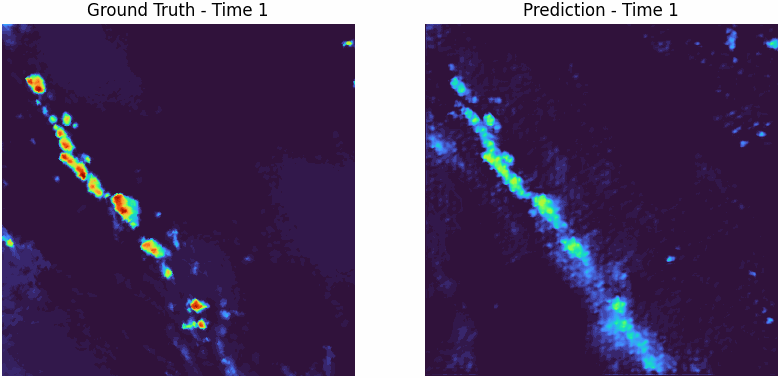

In [67]:
plot_predictions(y_pred_rescaled,y_actual_rescaled,"1")

In [101]:
# Obtain a batch of actual and projected values
X_batch, y_actual = next(val_gen)  # Getting the input and actual values of a batch from the generator
y_pred = final_model.predict(X_batch)  # Forecasting of the batch

y_pred_rescaled = y_pred * (254.0+1e-8)  # denormalize to [0, 254]
y_pred_rescaled = y_pred_rescaled.astype(np.uint8)  # convert to uint8
y_actual_rescaled = y_actual * (254.0+1e-8)
y_actual_rescaled = y_actual_rescaled.astype(np.uint8)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step


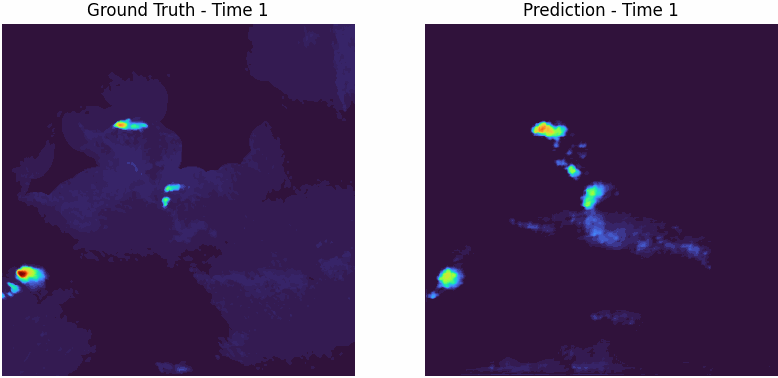

In [102]:
plot_predictions(y_pred_rescaled,y_actual_rescaled,"2")

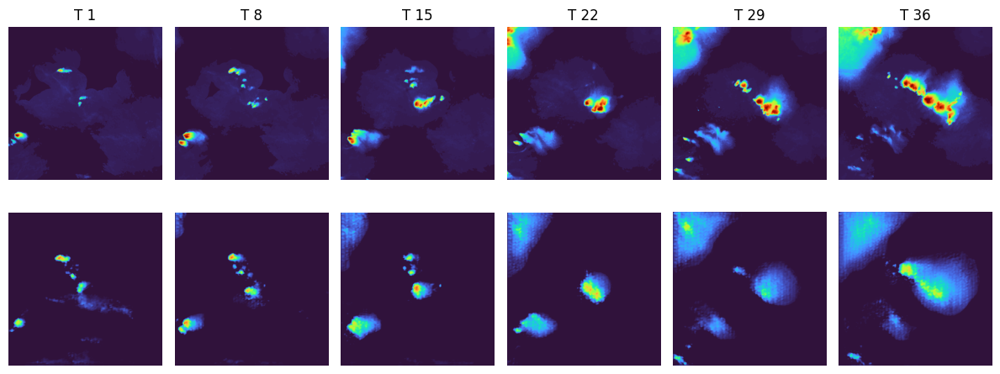

In [115]:
plot_predictions(y_pred_rescaled,y_actual_rescaled,"2",output_gif=False)

# Summary

Our Unet model combined with SE&CBAM works well. We tried many combinations of loss functions, but the effect was not much better than the initial one.but there is room for improvement, especially for sparse bright spot images. This is our future improvement space. In addition, during data preprocessing, some night visible light was not processed, resulting in poor generation of some images.